In [1]:
import os
# os.environ['JAX_PLATFORM_NAME'] = 'cpu'
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

In [2]:
import jax
import pickle
import numpy as np
from aim_resolve import OptimizeKLConfig, SetupKLConfig, get_builders, plot_arrays, map_signal

jax.config.update("jax_enable_x64", True)

jwst not installed. Some JWST functions will not work.
shapely not installed. Some JWST functions will not work.


In [3]:
def latest_model_file(directory):
    import os
    import re

    max_file = None
    max_it = -1
    for filename in os.listdir(directory + '/files'):
        match = re.compile(r'(\d+)_pre\.yml$').match(filename)
        if match:
            it = int(match.group(1))
            if it > max_it:
                max_it = it
                max_file = filename

    return directory + f'/files/{max_file}'



def box_markers(cfg, ps_map, grid, it):
    import numpy as np
    from aim_resolve import draw_boxes

    px, py = np.argwhere(ps_map == 1).T
    ps_mrk = dict(x=px, y=py, s=10, c='white', marker='+')
    box_map = draw_boxes(cfg.sections, grid, it)
    ox, oy = np.argwhere(box_map == 1).T
    oj_mrk = dict(x=ox, y=oy, s=0.1, c='white', marker=',')
    
    return dict(ps_mrk=ps_mrk, oj_mrk=oj_mrk)

In [5]:
eso_dir = '/scratch/users/rfuchs/packages/aim-resolve/steering/runs/fast_vi_1f_1024_2z_a'
eso_it = 3

cmap= 'inferno'

ARCMIN2RAD = np.pi / 60 / 180
AS2RAD = ARCMIN2RAD / 60
CONV_FACTOR = 1000 * AS2RAD**2


eso_yml = latest_model_file(eso_dir)
print('load:', eso_yml)

optim_cfg = OptimizeKLConfig.from_file((eso_dir + '/files/base.yml', eso_yml), get_builders, 'total')

sky_lst = [sec for sec in optim_cfg.sections if all(k in sec for k in ['sky', f'.{eso_it}'])]
print('sky components:', sky_lst)

skies_c, means_c, stds_c = [], [], []
with open(eso_dir + f'/opt/{eso_it}_rec/last.pkl', "rb") as f:
    smp_c, *_ = pickle.load(f)
for sec in sky_lst:
    sky_c = optim_cfg.instantiate_sec(sec)
    mean, std = smp_c.mean_and_std(sky_c)
    skies_c += [sky_c, ]
    means_c += [mean * CONV_FACTOR, ]
    stds_c += [std * CONV_FACTOR, ]


sky_bf = optim_cfg.instantiate_sec(f'sky.{eso_it-1}')
with open(eso_dir + f'/opt/{eso_it-1}_rec/last.pkl', "rb") as f:
    smp_bf, *_ = pickle.load(f)
mean_bf = smp_bf.mean(sky_bf) * CONV_FACTOR

load: /scratch/users/rfuchs/packages/aim-resolve/steering/runs/fast_vi_1f_1024_2z_a/files/3_pre.yml
sky components: ['sky.3', 'sky_bg.3', 'sky_p0.3', 'sky_o0.3', 'sky_o1.3', 'sky_o2.3', 'sky_t0.3']


In [6]:
odir = '/Users/rf/Development/packages/aim-resolve/steering/paper/plots_mJy'
odir = None

plot eso_boxes ...


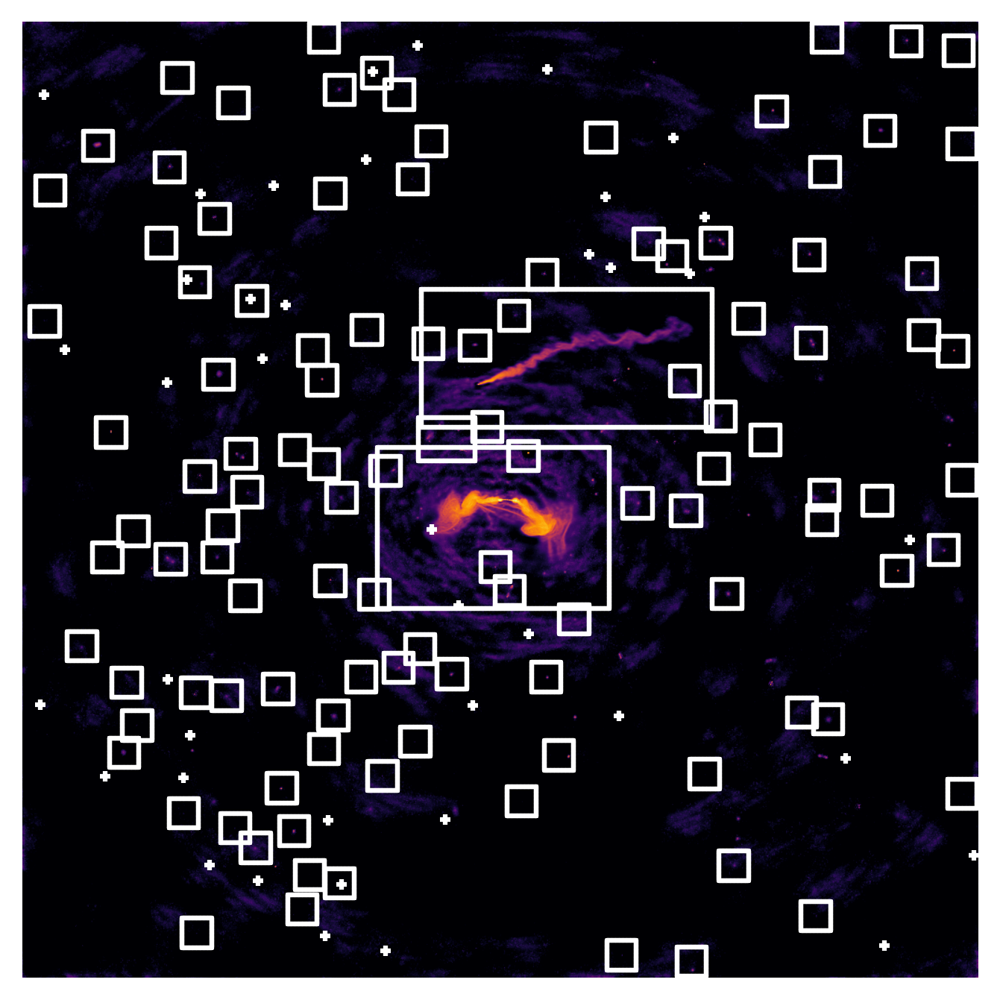

In [7]:
setup_cfg = SetupKLConfig.from_file(eso_yml)
ps_map = np.load(eso_dir + f'/files/{eso_it}_det.npz')['ps_map'].astype(float)
marker_it = box_markers(setup_cfg, ps_map, sky_bf.grid, eso_it)

mmin = 2e-4

vmin = mmin
vmax = mean_bf.max()

plot1 = mean_bf
marker1 = marker_it

print('plot eso_boxes ...')
plot_arrays(
    plot1, 
    name=f'eso_boxes', 
    odir=odir, 
    marker=marker1, 
    norm='log', 
    rows=1, 
    ticks=0, 
    cbar=False, 
    vmin=vmin, 
    vmax=vmax, 
    cmap=cmap,
    dpi=300,
)

plot eso_recs ...


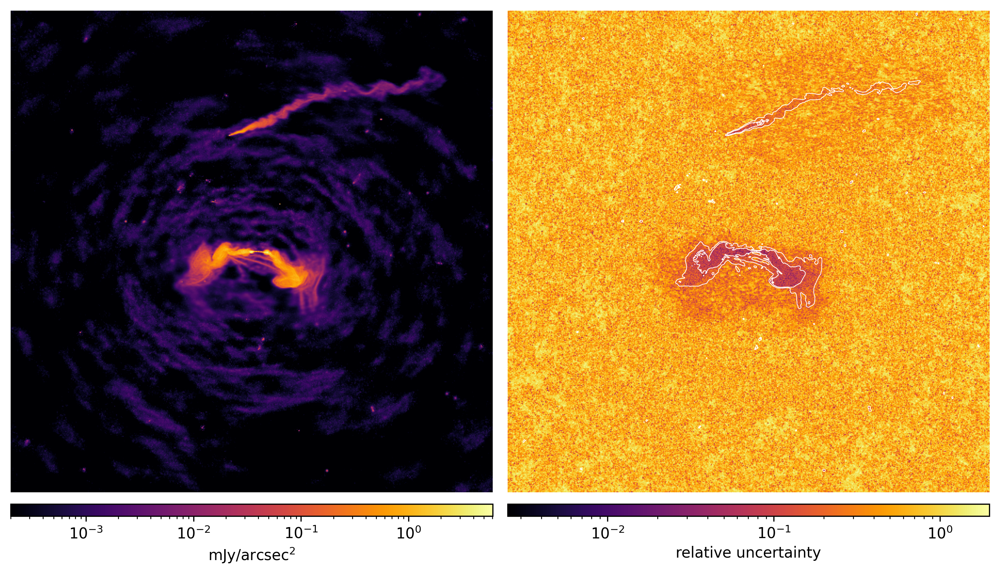

In [8]:
plot2_means = [means_c[0]]
plot2_stds = [stds_c[0]/means_c[0]]

mmax = max(np.max(arr) for arr in plot2_means)
smin = min(np.min(arr[arr>0]) for arr in plot2_stds)
smax = max(np.max(arr) for arr in plot2_stds)
vmin = [mmin, smin]
vmax = [mmax, smax]

grd = skies_c[0].grid
plots2 = [map_signal(grd, grd.update(space=grd.spc//2))(val) for pair in zip(plot2_means, plot2_stds) for val in pair]

labels2 = [
    # 'SCM: reconstructed mean',
    # 'SCM: relative standard deviation',
    'MCM: reconstructed mean',
    'MCM: relative standard deviation',
]

def callback(fig, axes):
    fig.text(0.03, 0.92, 'MCM reconstructed mean', fontsize=15, c='white')
    fig.text(0.51, 0.92, 'MCM relative uncertainty', fontsize=15, c='white')

print('plot eso_recs ...')
plot_arrays(
    plots2, 
    name='eso_recs', 
    odir=odir, 
    norm='log', 
    cols=2, 
    ticks=0, 
    vmin=vmin, 
    vmax=vmax, 
    cbar=True, 
    cbar_kwargs=[dict(loc='bottom', size='2.5%', pad='2.5%', label='mJy/arcsec$^2$'), dict(loc='bottom', size='2.5%', pad='2.5%', label='relative uncertainty')],
    figsize=(5, 5.5), 
    cmap=cmap, 
    # callback=callback,
    grid_kwargs=dict(hspace=0, wspace=-0.3, width_ratios=[1,1]),
    contour=[{}] + [{'array': plots2[0], 'colors': 'white', 'levels': [5e-3, 1e-1], 'linewidths': 0.5}],
    dpi=300,
)

plot eso_comps ...


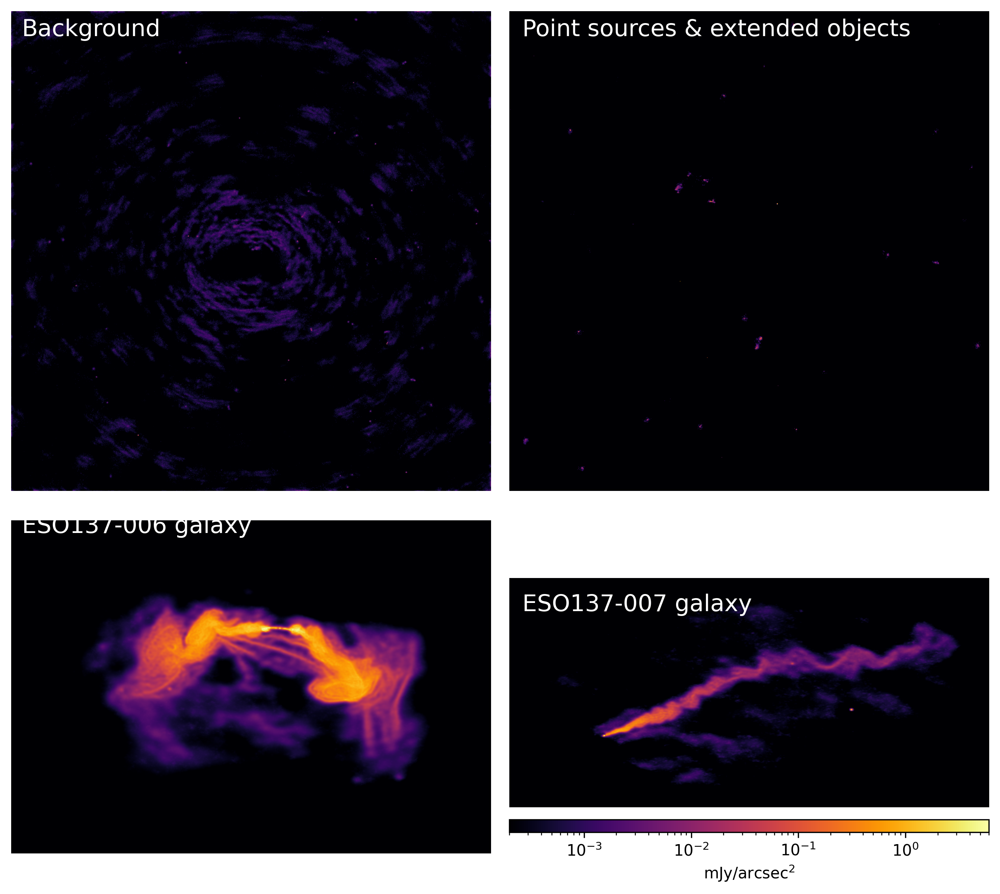

In [9]:
mean_pt = means_c[2] + means_c[-1] + map_signal(skies_c[-2].grid, grd)(means_c[-2])
mean_pt = np.where(mean_pt > 0, mean_pt, 1e-15)
plots3 = [
    map_signal(grd, grd.update(space=grd.spc//2))(means_c[1]),
    map_signal(grd, grd.update(space=grd.spc//2))(mean_pt),
    means_c[3],
    means_c[4],
]
vmin = mmin
vmax = max(np.max(arr) for arr in plots3)

labels3 = [
    'MCM: background mean',
    'MCM: point sources & small objects mean',
    'MCM: ESO137-006 galaxy mean',
    'MCM: ESO137-007 galaxy mean',
]

def callback(fig, axes):
    fig.text(0.072, 0.81, 'Background', fontsize=15, c='white')
    fig.text(0.52, 0.81, 'Point sources & extended objects', fontsize=15, c='white')
    fig.text(0.072, 0.365, 'ESO137-006 galaxy', fontsize=15, c='white')
    fig.text(0.52, 0.295, 'ESO137-007 galaxy', fontsize=15, c='white')

print('plot eso_comps ...')
plot_arrays(
    plots3, 
    name='eso_comps', 
    odir=odir, 
    norm='log', 
    cols=2, 
    ticks=0, 
    vmin=vmin, 
    vmax=vmax, 
    cbar=[False, False, False, True],
    cbar_kwargs={'loc': 'bottom', 'size': '5.5%', 'pad': '5.5%', 'label': 'mJy/arcsec$^2$'}, 
    figsize=(5, 5), 
    cmap=cmap,
    callback=callback,
    dpi=300,
    grid_kwargs=dict(hspace=-0.65, wspace=-0.5, width_ratios=[1,1], height_ratios=[1,0.5]),
)

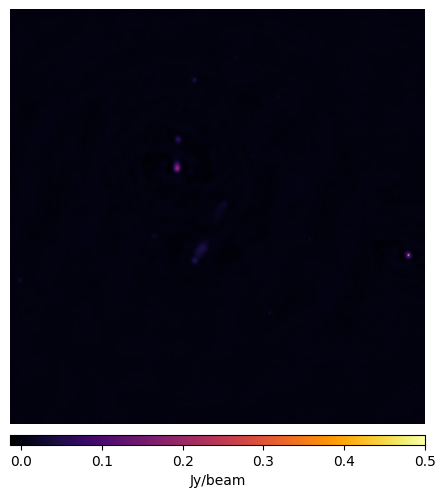

In [ ]:
from aim_resolve import Observation, SignalSpace, build_exact_responses


obs = Observation.load('/Users/rf/Development/data/exp_986-1137mhz.pkl')
obs = obs.to_double_precision()
obs = obs.to_resolve_obs()

space_1024 = SignalSpace.build(shape=(512, 512), fov=('2deg', '2deg'))

R, R_l, RNR, RNR_l = build_exact_responses(obs, space_1024)

from nifty8 import makeOp
N_inv = makeOp(obs.weight)
data = R.adjoint(N_inv(obs.vis))

ARCMIN2RAD = np.pi / 60 / 180
AS2RAD = ARCMIN2RAD / 60
CONV_FACTOR = 1000 * AS2RAD**2

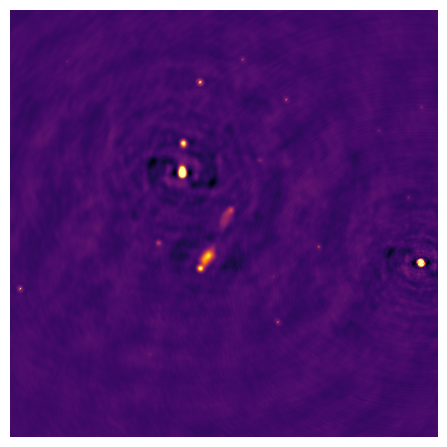

In [ ]:
plot_arrays(
    array=[data.val], # / space_1024.dis.prod() / np.sum(wgt)], 
    norm='linear', 
    dpi=100, 
    ticks=0, 
    cbar=True,
    cbar_kwargs={'loc': 'bottom', 'size': '2.5%', 'pad': '2.5%', 'label': 'Jy/beam'}, 
    vmax=0.054,
)

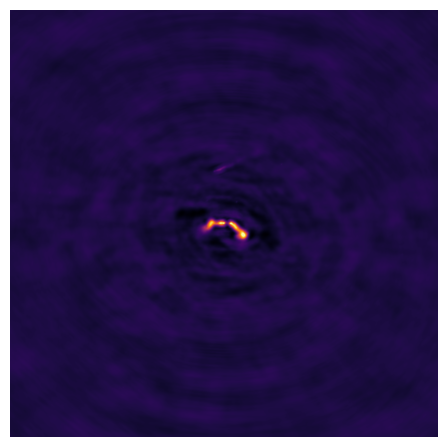

In [171]:
from aim_resolve import Observation, SignalSpace, build_exact_responses


obs = Observation.load('/Users/rf/Development/data/eso_986-1137mhz.npz')
obs = obs.to_double_precision()
obs = obs.to_resolve_obs()

space_1024 = SignalSpace.build(shape=(1024,1024), fov=('2deg', '2deg'))

R, R_l, RNR, RNR_l = build_exact_responses(obs, space_1024)

from nifty8 import makeOp
N_inv = makeOp(obs.weight)
dirty2 = R.adjoint(N_inv(obs.vis))
wgt = obs.weight.val

ARCMIN2RAD = np.pi / 60 / 180
AS2RAD = ARCMIN2RAD / 60
CONV_FACTOR = 1000 * AS2RAD**2

plot_arrays(
    array=[dirty2.val / space_1024.dis.prod() / np.sum(wgt)], 
    norm='linear', 
    dpi=100, 
    ticks=0, 
    cbar=False,
    cbar_kwargs={'loc': 'bottom', 'size': '2.5%', 'pad': '2.5%', 'label': 'Jy/beam'}, 
    vmax=0.9,
)

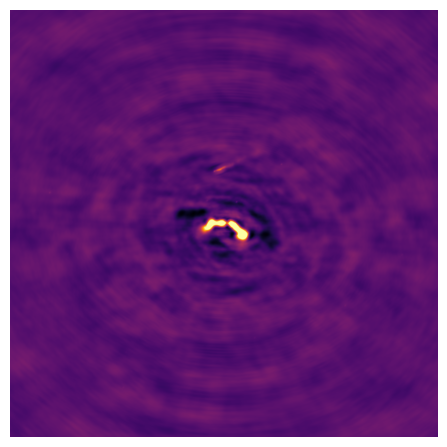

In [172]:
plot_arrays(
    array=[dirty2.val / space_1024.dis.prod() / np.sum(wgt)], 
    norm='linear', 
    dpi=100, 
    ticks=0, 
    cbar=False,
    cbar_kwargs={'loc': 'bottom', 'size': '2.5%', 'pad': '2.5%', 'label': 'Jy/beam'}, 
    vmax=0.34,
)

In [6]:
eso_dir = '/Users/rf/Development/packages/aim-resolve/steering/runs/eso_vi_1024l'
eso_it = 2

cmap= 'inferno'

ARCMIN2RAD = np.pi / 60 / 180
AS2RAD = ARCMIN2RAD / 60
CONV_FACTOR = 1000 * AS2RAD**2


eso_yml = latest_model_file(eso_dir)
print('load:', eso_yml)

optim_cfg = OptimizeKLConfig.from_file((eso_dir + '/files/base.yml', eso_yml), get_builders, 'total')

sky_lst = [sec for sec in optim_cfg.sections if all(k in sec for k in ['sky.', f'.{eso_it}'])]
print('sky components:', sky_lst)

samples = []
with open(eso_dir + f'/opt/{eso_it}_rec/last.pkl', "rb") as f:
    smp_c, *_ = pickle.load(f)
for sec in sky_lst:
    sky_c = optim_cfg.instantiate_sec(sec)
    spc = sky_c.space
    for s in smp_c:
        samples += [map_signal(sky_c(s), spc, spc.multiply_fov(0.5)) * CONV_FACTOR]

load: /Users/rf/Development/packages/aim-resolve/steering/runs/eso_vi_1024l/files/2_pre.yml
sky components: ['sky.2']


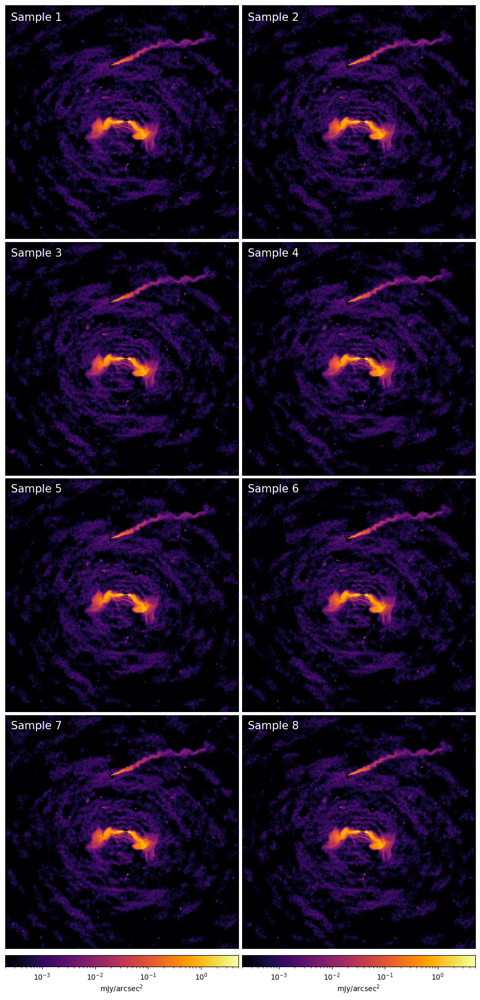

In [28]:
mmax = max(np.max(arr) for arr in samples)

def callback(fig, axes):
    fig.text(0.06, 0.946, 'Sample 1', fontsize=15, c='white')
    fig.text(0.515, 0.946, 'Sample 2', fontsize=15, c='white')
    fig.text(0.06, 0.72, 'Sample 3', fontsize=15, c='white')
    fig.text(0.515, 0.72, 'Sample 4', fontsize=15, c='white')
    fig.text(0.06, 0.494, 'Sample 5', fontsize=15, c='white')
    fig.text(0.515, 0.494, 'Sample 6', fontsize=15, c='white')
    fig.text(0.06, 0.267, 'Sample 7', fontsize=15, c='white')
    fig.text(0.515, 0.267, 'Sample 8', fontsize=15, c='white')

plot_arrays(
    samples, 
    norm='log', 
    dpi=100, 
    rows=4, 
    ticks=0, 
    vmin=2e-4, 
    vmax=mmax, 
    cbar=[False]*6 + [True]*2,
    cbar_kwargs=dict(loc='bottom', size='5%', pad='2.5%', label='mJy/arcsec$^2$'), 
    cmap=cmap,
    grid_kwargs=dict(hspace=-0.57, wspace=-0.66, width_ratios=[1,1], height_ratios=[1,1,1,1]),
    callback=callback,
)

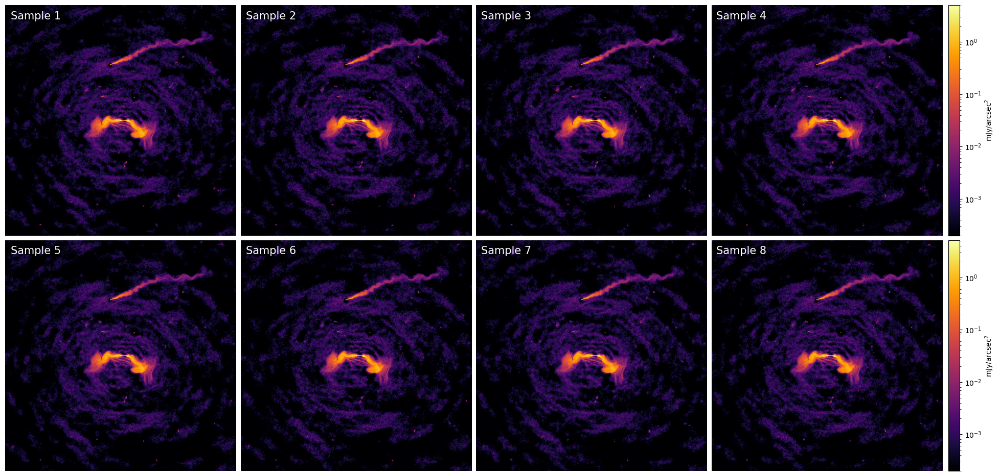

In [18]:
mmax = max(np.max(arr) for arr in samples)

def callback(fig, axes):
    fig.text(0.03, 0.945, 'Sample 1', fontsize=15, c='white')
    fig.text(0.26, 0.945, 'Sample 2', fontsize=15, c='white')
    fig.text(0.49, 0.945, 'Sample 3', fontsize=15, c='white')
    fig.text(0.72, 0.945, 'Sample 4', fontsize=15, c='white')
    fig.text(0.03, 0.485, 'Sample 5', fontsize=15, c='white')
    fig.text(0.26, 0.485, 'Sample 6', fontsize=15, c='white')
    fig.text(0.49, 0.485, 'Sample 7', fontsize=15, c='white')
    fig.text(0.72, 0.485, 'Sample 8', fontsize=15, c='white')

plot_arrays(
    samples, 
    norm='log', 
    dpi=100, 
    rows=2, 
    ticks=0, 
    vmin=2e-4, 
    vmax=mmax, 
    cbar=[False]*3 + [True] + [False]*3 + [True],
    cbar_kwargs=dict(loc='right', size='5%', pad='2.5%', label='mJy/arcsec$^2$'), 
    cmap=cmap,
    grid_kwargs=dict(hspace=-0.61, wspace=-0.42, width_ratios=[1,1,1,1], height_ratios=[1,1]),
    callback=callback,
)